In [1]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas_profiling
from scipy import stats
import numpy as np
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
import pandas_profiling

In [2]:
wells = pd.read_csv('InjectionWells.csv')
earthquakes = pd.read_csv('okQuakes.csv')

In [3]:
wells = wells[wells['LAT'].notna()]
wells = wells[wells['LONG'].notna()]

## Exploring the data

Check out columns and null values for both datasets

In [4]:
wells.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11125 entries, 0 to 11124
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   API#           11125 non-null  float64
 1   Operator       11125 non-null  object 
 2   Operator ID    11125 non-null  float64
 3   WellType       11125 non-null  object 
 4   WellName       11124 non-null  object 
 5   WellNumber     11124 non-null  object 
 6   OrderNumbers   11124 non-null  float64
 7   Approval Date  11125 non-null  object 
 8   County         11125 non-null  object 
 9   Sec            11125 non-null  object 
 10  Twp            11125 non-null  object 
 11  Rng            11125 non-null  object 
 12  QQQQ           11125 non-null  object 
 13  LAT            11125 non-null  float64
 14  LONG           11125 non-null  float64
 15  PSI            9689 non-null   object 
 16  BBLS           9689 non-null   object 
 17  ZONE           11125 non-null  object 
 18  Unname

In [5]:
earthquakes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13954 entries, 0 to 13953
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             13954 non-null  object 
 1   latitude         13954 non-null  float64
 2   longitude        13954 non-null  float64
 3   depth            13954 non-null  float64
 4   mag              13948 non-null  float64
 5   magType          13933 non-null  object 
 6   nst              5389 non-null   float64
 7   gap              12433 non-null  float64
 8   dmin             5621 non-null   float64
 9   rms              12749 non-null  float64
 10  net              13954 non-null  object 
 11  id               13954 non-null  object 
 12  updated          13954 non-null  object 
 13  place            13954 non-null  object 
 14  type             13954 non-null  object 
 15  horizontalError  10756 non-null  float64
 16  depthError       12144 non-null  float64
 17  magError    

In [6]:
earthquakes.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,1973-03-17T07:43:05.500Z,36.087,-106.168,6.0,4.5,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:10.078Z,New Mexico,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
1,1973-05-25T14:40:13.900Z,33.917,-90.775,6.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:12.859Z,Mississippi,earthquake,NaN,NaN,NaN,NaN,reviewed,s,us
2,1973-09-19T13:28:20.500Z,37.160,-104.594,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:20.295Z,Colorado,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
3,1973-09-23T03:58:54.900Z,37.148,-104.571,5.0,4.2,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:20.346Z,Colorado,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
4,1974-02-15T13:33:49.200Z,36.500,-100.693,24.0,4.5,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:22.859Z,Oklahoma,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us


Turn time column into datetime format, remove hour information to match up with the wells dataset, set time as the index

In [7]:
earthquakes['time'] = pd.to_datetime(earthquakes['time'])
earthquakes['Date'] = earthquakes['time'].dt.date
earthquakes = earthquakes.set_index('Date')
earthquakes.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
Date,,,,,,,,,,,,,,,,,,,,,
1973-03-17,1973-03-17 07:43:05.500000+00:00,36.087,-106.168,6.0,4.5,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:10.078Z,New Mexico,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
1973-05-25,1973-05-25 14:40:13.900000+00:00,33.917,-90.775,6.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:12.859Z,Mississippi,earthquake,NaN,NaN,NaN,NaN,reviewed,s,us
1973-09-19,1973-09-19 13:28:20.500000+00:00,37.160,-104.594,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:20.295Z,Colorado,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
1973-09-23,1973-09-23 03:58:54.900000+00:00,37.148,-104.571,5.0,4.2,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:20.346Z,Colorado,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us
1974-02-15,1974-02-15 13:33:49.200000+00:00,36.500,-100.693,24.0,4.5,mb,NaN,NaN,NaN,NaN,...,2014-11-06T23:21:22.859Z,Oklahoma,earthquake,NaN,NaN,NaN,NaN,reviewed,us,us


In [8]:
wells.head()

,API#,Operator,Operator ID,WellType,WellName,WellNumber,OrderNumbers,Approval Date,County,Sec,...,Rng,QQQQ,LAT,LONG,PSI,BBLS,ZONE,Unnamed: 18,Unnamed: 19,Unnamed: 20
0,3.500300e+09,PHOENIX PETROCORP INC,19499.0,2R,SE EUREKA UNIT-TUCKER #1,21,133856.0,9/6/1977,ALFALFA,13,...,10W,C-SE SE,36.900324,-98.21826,"2,500",300,CHEROKEE,NaN,NaN,NaN
1,3.500300e+09,CHAMPLIN EXPLORATION INC,4030.0,2R,CHRISTENSEN,1,470258.0,11/27/2002,ALFALFA,21,...,09W,C-NW NW,36.896636,-98.17772,"2,400","1,000",RED FORK,NaN,NaN,NaN
2,3.500321e+09,LINN OPERATING INC,22182.0,2R,NE CHEROKEE UNIT,85,329426.0,8/19/1988,ALFALFA,24,...,11W,SE NE,36.806113,-98.32584,"1,050","1,000",RED FORK,NaN,NaN,NaN
3,3.500321e+09,SANDRIDGE EXPLORATION & PRODUCTION LLC,22281.0,2R,VELMA,2-19,281652.0,7/11/1985,ALFALFA,19,...,10W,SW NE NE SW,36.888589,-98.31853,"3,152","1,000",RED FORK,NaN,NaN,NaN
4,3.500321e+09,CHAMPLIN EXPLORATION INC,4030.0,2R,GRAY,1A,470257.0,11/27/2002,ALFALFA,20,...,09W,SE SW NW,36.892128,-98.19462,"1,000","2,400",RED FORK,NaN,NaN,NaN


In [9]:
wells['Date'] = pd.to_datetime(wells['Approval Date'])
wells = wells.set_index('Date')
wells.head()

,API#,Operator,Operator ID,WellType,WellName,WellNumber,OrderNumbers,Approval Date,County,Sec,...,Rng,QQQQ,LAT,LONG,PSI,BBLS,ZONE,Unnamed: 18,Unnamed: 19,Unnamed: 20
Date,,,,,,,,,,,,,,,,,,,,,
1977-09-06,3.500300e+09,PHOENIX PETROCORP INC,19499.0,2R,SE EUREKA UNIT-TUCKER #1,21,133856.0,9/6/1977,ALFALFA,13,...,10W,C-SE SE,36.900324,-98.21826,"2,500",300,CHEROKEE,NaN,NaN,NaN
2002-11-27,3.500300e+09,CHAMPLIN EXPLORATION INC,4030.0,2R,CHRISTENSEN,1,470258.0,11/27/2002,ALFALFA,21,...,09W,C-NW NW,36.896636,-98.17772,"2,400","1,000",RED FORK,NaN,NaN,NaN
1988-08-19,3.500321e+09,LINN OPERATING INC,22182.0,2R,NE CHEROKEE UNIT,85,329426.0,8/19/1988,ALFALFA,24,...,11W,SE NE,36.806113,-98.32584,"1,050","1,000",RED FORK,NaN,NaN,NaN
1985-07-11,3.500321e+09,SANDRIDGE EXPLORATION & PRODUCTION LLC,22281.0,2R,VELMA,2-19,281652.0,7/11/1985,ALFALFA,19,...,10W,SW NE NE SW,36.888589,-98.31853,"3,152","1,000",RED FORK,NaN,NaN,NaN
2002-11-27,3.500321e+09,CHAMPLIN EXPLORATION INC,4030.0,2R,GRAY,1A,470257.0,11/27/2002,ALFALFA,20,...,09W,SE SW NW,36.892128,-98.19462,"1,000","2,400",RED FORK,NaN,NaN,NaN


In [10]:
wells.sort_index()

,API#,Operator,Operator ID,WellType,WellName,WellNumber,OrderNumbers,Approval Date,County,Sec,...,Rng,QQQQ,LAT,LONG,PSI,BBLS,ZONE,Unnamed: 18,Unnamed: 19,Unnamed: 20
Date,,,,,,,,,,,,,,,,,,,,,
1936-12-18,3.501923e+09,XTO ENERGY INC,21003.0,2R,HEWITT UNIT 22,1103,3.068040e+05,12/18/1936,CARTER,22,...,02W,SW NE NW,34.199067,-97.399092,"1,100","3,500","HEWITT (HOXBAR, DEESE)",NaN,NaN,NaN
1945-04-22,3.514707e+09,GATEWAY RESOURCES USA INC,18192.0,2R,ANDY BROWN,3-W,3.231000e+04,4/22/1945,WASHINGTON,22,...,13E,NW NE NE,36.901903,-95.900888,NaN,NaN,WAYSIDE,NaN,NaN,NaN
1946-10-19,3.508104e+09,WHITE MONTY & TERRY PRODUCTION,12538.0,2D,"ROLLER, B. H.",1,1.939300e+04,10/19/1946,LINCOLN,15,...,05E,SE NW SW,35.511472,-96.767417,0,100,UNKNOWN FORMATION,NaN,NaN,NaN
1947-03-18,3.511702e+09,CIRCLE 9 RESOURCES LLC,23209.0,2R,SCHOOL LAND 66,43,1.985200e+04,3/18/1947,PAWNEE,36,...,05E,SE SE NW,36.167568,-96.722799,NaN,NaN,BARTLESVILLE,NaN,NaN,NaN
1947-03-18,3.511701e+09,CIRCLE 9 RESOURCES LLC,23209.0,2R,SCHOOL LAND 66,37,1.985200e+04,3/18/1947,PAWNEE,36,...,05E,S2 N2 N2 SE,36.164978,-96.717249,NaN,NaN,BARTLESVILLE,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-30,3.501925e+09,CITATION OIL & GAS CORPORATION,14156.0,2R,COX PENN SAND UNIT,142,1.709600e+09,8/30/2017,CARTER,22,...,02W,NW SW NE NW,34.373645,-97.399878,"1,500",999,PENNSYLVANIA SAND (DEESE),NaN,NaN,NaN
2017-08-30,3.501124e+09,OVERFLOW ENERGY LLC,22383.0,CDW,BRIDGER CREEK SWD,1,1.800070e+09,8/30/2017,BLAINE,30,...,12W,NW NW NW,0.000000,0.000000,"1,550","19,500","WOLFCAMPIAN, VIRGILIAN",NaN,NaN,NaN
2017-08-30,3.507326e+09,"OVERFLOW ENERGY, LLC",22383.0,CDW,BANNER ROAD SWD,1,1.800070e+09,8/30/2017,KINGFISHER,26,...,06W,NE NE NE,0.000000,0.000000,"1,625","19,500","WOLFCAMP, VIRGILIAN",NaN,NaN,NaN


In [11]:
wells['temp'] = '2016-09-20'
wells['temp'] = pd.to_datetime(wells['temp'])
wells['Days Active'] = wells['temp'] - wells.index
wells = wells.drop(['temp'], axis=1)

Look at unique values of PSI/BBLS in wells to find odd values that need to be fixed before changing type from object to float

In [12]:
wells['PSI'].unique()

array(['2,500', '2,400', '1,050', '3,152', '1,000', '750', '1,280', '0',
       '1,500', '3,500', '500', '1,250', '2,000', '3,000', '2,800',
       '2,264', '2,320', '2,375', '2,285', '2,300', '400', '2,250',
       '2,450', '5,915', '250', '700', '1,450', '1,200', '1,400', '300',
       '50', '914', '1,350', nan, '1,600', '902', '100', '1,700', '325',
       '110', '850', '800', '200', '1,900', '1,800', '2,150', '1,912',
       '1,640', '1,688', '2,100', '1,785', '2,475', '1,650', '1,550',
       '1,300', '900', '435', '2,200', '1,675', '4,900', '4,500', '4,978',
       '3,600', '1,140', '5,500', '5,000', '4,000', '801', '980', '1,100',
       '982', '1,850', '650', '840', '1,026', '950', '1,076', '1,008',
       '600', '1,014', '1,816', '1,740', '1,750', '825', '2,342', '2,570',
       '420', '1,115', '1,087', '1,235', '1,290', '1,305', '1,210',
       '1,862', '3,150', '2,245', '150', '886', '722', '1,145', '1,340',
       '796', '1,080', '1,109', '1,195', '1,085', '443', '75', '2,7

In [13]:
wells['BBLS'].unique()

array(['300', '1,000', '2,400', '2,000', '1,800', '750', '1,200', '4,500',
       '1,500', '20,000', '2,500', '3,000', '100', '50,000', '19,900',
       '60,000', '19,500', '100,000', '80,000', '15,000', '10,000',
       '65,000', '45,000', '25,000', '40,000', '14,000', '800', '500',
       '35', '19,990', '600', '6,000', '14,400', '690', '200', '8,400',
       '1,300', '2,200', '3,200', '12,000', '5,000', '80', nan, '1,400',
       '2,100', '50', '7,000', '30', '40', '4,000', '900', '4,999',
       '8,000', '4,900', '400', '35,000', '650', '0', '7,200', '2,080',
       '60', '30,000', '7,500', '19,000', '13,000', '4,600', '2,700',
       '3,600', '1,700', '20', '270', '75', '150', '350', '2,600',
       '1,625', '925', '550', '250', '3,500', '1,150', '2,550', '1,900',
       '1,350', '850', '1,100', '130', '325', '327', '675', '995', '680',
       '1,600', '700', '2,800', '26,800', '420', '950', '1,270', '375',
       '1,170', '1,380', '1,650', '5,200', '2,850', '1,445', '1,560',
    

Remove commas, and change odd values. There are a few others that will be dealt with differently

In [14]:
wells['PSI'] = wells['PSI'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace('V-1600 CH 300', '300', regex=True)
wells['PSI'] = wells['PSI'].replace('V-2000 CH 1700', '1700', regex=True)

There quite a few odd values with this format: '202B/428G', '226B/478G', '227B/481G', '218B/461G'. The next step is to temporarily remove them, change the type of the rest of the remaining rows to float and find the mean/median. Then the temp dataset will replace the odd values with the mean/median, change type to float, and merge back to the original dataset

In [15]:
temp = wells.loc[wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G'])]

In [16]:
temp.head()

,API#,Operator,Operator ID,WellType,WellName,WellNumber,OrderNumbers,Approval Date,County,Sec,...,QQQQ,LAT,LONG,PSI,BBLS,ZONE,Unnamed: 18,Unnamed: 19,Unnamed: 20,Days Active
Date,,,,,,,,,,,,,,,,,,,,,
2002-08-26,3.505320e+09,ONEOK HYDROCARBON LP,21099.0,GS,KOCH FEE,1,467137.0,8/26/2002,GRANT,32,...,SW SW NE,36.775520,-97.75719,224B/475G,24000,"HUTCHINSON, PERMIAN",NaN,NaN,NaN,5139 days
2002-08-26,3.505320e+09,ONEOK HYDROCARBON LP,21099.0,GS,KOCH FEE,2,467142.0,8/26/2002,GRANT,32,...,SW SW NE,36.775520,-97.75719,226B/479G,24000,"HUTCHINSON, PERMIAN",NaN,NaN,NaN,5139 days
2002-08-26,3.505320e+09,ONEOK HYDROCARBON LP,21099.0,GS,KOCH FEE,4,467141.0,8/26/2002,GRANT,32,...,NW NW NE,36.780958,-97.75719,219B/464G,24000,"HUTCHINSON, PERMIAN",NaN,NaN,NaN,5139 days
2002-08-26,3.505320e+09,ONEOK HYDROCARBON LP,21099.0,GS,KOCH FEE,5,467140.0,8/26/2002,GRANT,32,...,NW NW NE,36.780958,-97.75719,222B/470G,24000,"HUTCHINSON, PERMIAN",NaN,NaN,NaN,5139 days
2002-08-29,3.505320e+09,ONEOK HYDROCARBON LP,21099.0,GS,KOCH FEE,6,467341.0,8/29/2002,GRANT,32,...,NW NW NE,36.780958,-97.75719,235B/498G,24000,"HUTCHINSON, PERMIAN",NaN,NaN,NaN,5136 days


In [17]:
wells =  wells.loc[~wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G',])]


In [18]:
wells['PSI'].unique()

array(['2500', '2400', '1050', '3152', '1000', '750', '1280', '0', '1500',
       '3500', '500', '1250', '2000', '3000', '2800', '2264', '2320',
       '2375', '2285', '2300', '400', '2250', '2450', '5915', '250',
       '700', '1450', '1200', '1400', '300', '50', '914', '1350', nan,
       '1600', '902', '100', '1700', '325', '110', '850', '800', '200',
       '1900', '1800', '2150', '1912', '1640', '1688', '2100', '1785',
       '2475', '1650', '1550', '1300', '900', '435', '2200', '1675',
       '4900', '4500', '4978', '3600', '1140', '5500', '5000', '4000',
       '801', '980', '1100', '982', '1850', '650', '840', '1026', '950',
       '1076', '1008', '600', '1014', '1816', '1740', '1750', '825',
       '2342', '2570', '420', '1115', '1087', '1235', '1290', '1305',
       '1210', '1862', '3150', '2245', '150', '886', '722', '1145',
       '1340', '796', '1080', '1109', '1195', '1085', '443', '75', '2750',
       '2280', '2947', '2517', '550', '1075', '1135', '2504', '1775',
       

In [19]:
wells['PSI'] = wells['PSI'].astype(float)

In [20]:
wells['PSI'].median()

750.0

In [21]:
temp['PSI1'] = '750'
temp = temp.drop(['PSI'], axis=1)
temp.rename(columns = {'PSI1':'PSI'}, inplace = True)
temp['PSI'] = temp['PSI'].astype(float)

In [22]:
temp.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28 entries, 2002-08-26 to 2002-09-09
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   API#           28 non-null     float64        
 1   Operator       28 non-null     object         
 2   Operator ID    28 non-null     float64        
 3   WellType       28 non-null     object         
 4   WellName       28 non-null     object         
 5   WellNumber     28 non-null     object         
 6   OrderNumbers   28 non-null     float64        
 7   Approval Date  28 non-null     object         
 8   County         28 non-null     object         
 9   Sec            28 non-null     object         
 10  Twp            28 non-null     object         
 11  Rng            28 non-null     object         
 12  QQQQ           28 non-null     object         
 13  LAT            28 non-null     float64        
 14  LONG           28 non-null     float64  

In [23]:
wells = pd.concat([wells, temp])

In [24]:
wells['BBLS'] = wells['BBLS'].astype(float)

In [25]:
wells.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11125 entries, 1977-09-06 to 2002-09-09
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   API#           11125 non-null  float64        
 1   Operator       11125 non-null  object         
 2   Operator ID    11125 non-null  float64        
 3   WellType       11125 non-null  object         
 4   WellName       11124 non-null  object         
 5   WellNumber     11124 non-null  object         
 6   OrderNumbers   11124 non-null  float64        
 7   Approval Date  11125 non-null  object         
 8   County         11125 non-null  object         
 9   Sec            11125 non-null  object         
 10  Twp            11125 non-null  object         
 11  Rng            11125 non-null  object         
 12  QQQQ           11125 non-null  object         
 13  LAT            11125 non-null  float64        
 14  LONG           11125 non-null  float6

In [26]:
wells = wells.drop(['API#', 'Operator', 'Operator ID', 'WellType', 'WellName', 'WellNumber', 'OrderNumbers', 'Sec', 'Twp', 'Rng', 'QQQQ', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20'], axis=1)
wells = wells.drop(['Approval Date'], axis=1)

In [27]:
wells.rename(columns = {'LAT':'Latitude', 'LONG':'Longitude'}, inplace = True)

In [28]:
wells = wells.drop_duplicates()

In [29]:
wells['PSI'] = wells['PSI'].fillna(750.0)

In [30]:
wells['BBLS'].median()

1100.0

In [31]:
wells['BBLS'] = wells['BBLS'].fillna(1100)

In [32]:
psi_high = wells['PSI'].mean() + 3 * wells['PSI'].std()
psi_low = wells['PSI'].mean() - 3 * wells['PSI'].std()
bbls_high = wells['BBLS'].mean() + 3 * wells['BBLS'].std()
bbls_low = wells['BBLS'].mean() - 3 * wells['BBLS'].std()

wells = wells[(wells['PSI'] < psi_high) & (wells['PSI'] > psi_low)]
wells = wells[(wells['BBLS'] < bbls_high) & (wells['BBLS'] > bbls_low)]

In [33]:
wells['Yearly Voume'] = wells['BBLS'] * 365
wells.rename(columns = {'BBLS':'Daily Volume'}, inplace = True)

In [34]:
wells['Type'] = 'Injection Well'

In [35]:
wells.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10690 entries, 1977-09-06 to 2002-09-09
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype          
---  ------        --------------  -----          
 0   County        10690 non-null  object         
 1   Latitude      10690 non-null  float64        
 2   Longitude     10690 non-null  float64        
 3   PSI           10690 non-null  float64        
 4   Daily Volume  10690 non-null  float64        
 5   ZONE          10690 non-null  object         
 6   Days Active   10690 non-null  timedelta64[ns]
 7   Yearly Voume  10690 non-null  float64        
 8   Type          10690 non-null  object         
dtypes: float64(5), object(3), timedelta64[ns](1)
memory usage: 835.2+ KB


In [36]:
earthquakes = earthquakes.drop(['nst', 'magType', 'dmin', 'net', 'updated', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource'], axis=1)
earthquakes = earthquakes.drop(['gap'], axis=1)
earthquakes = earthquakes.drop(['time'], axis=1)

In [37]:
earthquakes = earthquakes.loc[~earthquakes['type'].isin(['explosion', 'rock burst', 'mining explosion', 'mine collapse'])]

In [38]:
earthquakes.rename(columns = {'latitude':'Latitude', 'longitude':'Longitude', 'depth':'Depth', 'mag':'Magnitude', 'rms':'Velocity', 'place':'Place', 'type':'Type'}, inplace = True)
earthquakes.rename(columns = {'id':'ID'}, inplace = True)

In [39]:
earthquakes['Magnitude'].median()

2.6

In [40]:
earthquakes['Magnitude'] = earthquakes['Magnitude'].fillna(2.6)

In [41]:
earthquakes['Velocity'].median()

0.4

In [42]:
earthquakes['Velocity'] = earthquakes['Velocity'].fillna(0.4)

In [43]:
earthquakes.head()

,Latitude,Longitude,Depth,Magnitude,Velocity,ID,Place,Type
Date,,,,,,,,
1973-03-17,36.087,-106.168,6.0,4.5,0.4,usp00000z6,New Mexico,earthquake
1973-05-25,33.917,-90.775,6.0,2.6,0.4,usp00001xj,Mississippi,earthquake
1973-09-19,37.160,-104.594,5.0,2.6,0.4,usp00003fw,Colorado,earthquake
1973-09-23,37.148,-104.571,5.0,4.2,0.4,usp00003hd,Colorado,earthquake
1974-02-15,36.500,-100.693,24.0,4.5,0.4,usp00005ac,Oklahoma,earthquake


In [241]:
merge = pd.concat([wells,earthquakes])

In [242]:
merge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24636 entries, 1977-09-06 00:00:00 to 2016-09-20
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype          
---  ------        --------------  -----          
 0   County        10690 non-null  object         
 1   Latitude      24636 non-null  float64        
 2   Longitude     24636 non-null  float64        
 3   PSI           10690 non-null  float64        
 4   Daily Volume  10690 non-null  float64        
 5   ZONE          10690 non-null  object         
 6   Days Active   10690 non-null  timedelta64[ns]
 7   Yearly Voume  10690 non-null  float64        
 8   Type          24636 non-null  object         
 9   Depth         13946 non-null  float64        
 10  Magnitude     13946 non-null  float64        
 11  Velocity      13946 non-null  float64        
 12  ID            13946 non-null  object         
 13  Place         13946 non-null  object         
dtypes: float64(8), object(5), timedelta64[ns](1)
memory 

In [255]:
map_earthquakes = folium.Map( location=[35.207878,-96.849979], zoom_start=7)

#earthquakes['marker_color'] = pd.cut(earthquakes['mag'], bins=4, 
                             # labels=['yellow', 'green', 'blue', 'red'])

#FastMarkerCluster(data=list(zip(earthquakes['latitude'].values, earthquakes['longitude'].values))).add_to(map_earthquakes)
#FastMarkerCluster(data=list(zip(wells['LAT'].values, wells['LONG'].values))).add_to(map_earthquakes)
#folium.LayerControl().add_to(map_earthquakes)



earthquakes.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'red', fill_opacity=0.6).add_to(map_earthquakes), axis=1)
wells.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'blue', fill_opacity=0.6).add_to(map_earthquakes), axis=1)

map_earthquakes

https://github.com/python-visualization/folium/issues/1010

In [136]:
wells_report = pandas_profiling.ProfileReport(wells)

In [145]:
earthquakes_report = pandas_profiling.ProfileReport(earthquakes)

In [166]:
merge_report = pandas_profiling.ProfileReport(earthquakes)

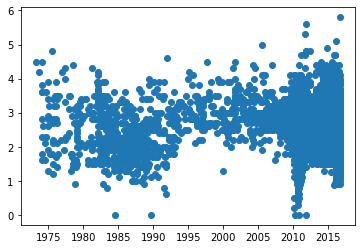

In [50]:
plt.scatter(earthquakes.index, earthquakes['mag'])
plt.show()

In [245]:
wells = wells.sort_index()
earthquakes = earthquakes.sort_index()

In [173]:
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Value', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()



Modified from: https://www.machinelearningplus.com/time-series/time-series-analysis-python/

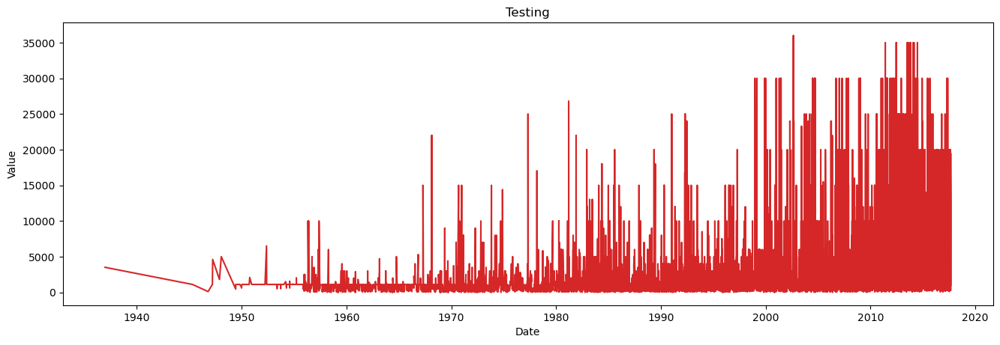

In [246]:
plot_df(wells, x=wells.index, y=wells['Daily Volume'], title='Testing')

In [191]:
sns.countplot(wells.index)
plt.show()

AttributeError: 'DatetimeIndexResampler' object has no attribute 'index'

C:\Users\jdgil\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


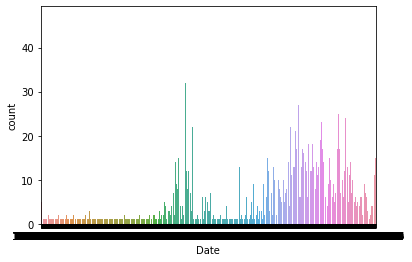

In [182]:
sns.countplot(earthquakes.index)
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Initial Pokemon - 1st Generation')

# Bulbasaur
sns.barplot(ax=axes[0], x=bulbasaur.index, y=bulbasaur.values)
axes[0].set_title(bulbasaur.name)

# Charmander
sns.barplot(ax=axes[1], x=charmander.index, y=charmander.values)
axes[1].set_title(charmander.name)

# Squirtle
sns.barplot(ax=axes[2], x=squirtle.index, y=squirtle.values)
axes[2].set_title(squirtle.name)

<AxesSubplot:xlabel='Date,Date'>

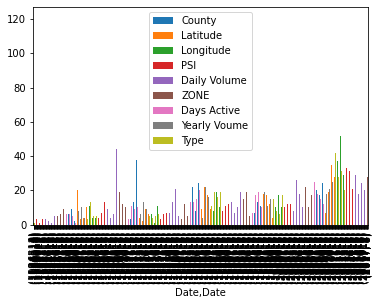

In [184]:
wells.groupby([wells.index.year, wells.index.month]).count().plot(kind="bar")

In [251]:
wells.shape[0]

10690

C:\Users\jdgil\anaconda3\lib\site-packages\cartopy\io\__init__.py:241: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/10m/cultural/ne_10m_admin_1_states_provinces_lakes.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


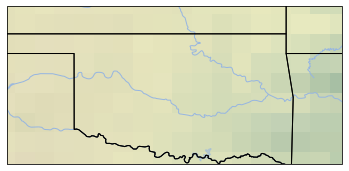

In [259]:

list_lat= []
list_long = []

for k in range(wells.shape[0]):
        
            list_lat.append(wells.iloc[k, 1])
            list_long.append(wells.iloc[k, 2])
#Change the already appended values to a different value
            wells.iloc[k, 1] = 500 
            wells.iloc[k, 2] = 500
        
            
list_lat[0:5] 
list_long[0:5]
#Removing the 500s from the list
#Latitude
for i in range(list_lat.count(500)):
    list_lat.remove(500)
#Longitude
for i in range(list_long.count(500)):
    list_long.remove(500)


#Importing required libraries
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import cartopy.mpl.geoaxes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.animation import FuncAnimation


#Creating the map object
fig = plt.figure()
m1 = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
m1.set_extent([-93.2, -101.7, 33.7, 37.7])
#Adding features to the map
m1.add_feature(cfeature.LAND)   
m1.add_feature(cfeature.OCEAN)
m1.add_feature(cfeature.COASTLINE)
m1.add_feature(cfeature.BORDERS, linestyle=':')
m1.add_feature(cfeature.LAKES, alpha=0.5)
m1.add_feature(cfeature.RIVERS)
m1.add_feature(cfeature.STATES)
m1.stock_img()

X_points_1 = list_long
Y_points_1= list_lat
def animate(i):
    X_points= X_points_1[0]
    Y_points= Y_points_1[0]
    X_points_1.remove(X_points_1[0])
    Y_points_1.remove(Y_points_1[0])
    m1.scatter(X_points, Y_points, color = 'red')
ani= FuncAnimation(fig, animate, 265, interval=200, repeat = False)
plt.show()

modified from: https://medium.com/analytics-vidhya/creating-map-animations-using-python-3b52061768a3